## remove background

In [1]:
#!pip install rembg
#!pip install onnxruntime

import os
from rembg import remove
from PIL import Image
import io

input_base_folder = r"F:\Gruaduation project\Dataset before"
output_base_folder = r"F:\Gruaduation project\Dataset after"
os.makedirs(output_base_folder, exist_ok=True)

for subfolder in os.listdir(input_base_folder):
    input_subfolder_path = os.path.join(input_base_folder, subfolder)
    if os.path.isdir(input_subfolder_path):  
        output_subfolder_path = os.path.join(output_base_folder, subfolder)
        os.makedirs(output_subfolder_path, exist_ok=True)  

        for filename in os.listdir(input_subfolder_path):
            if filename.lower().endswith((".png", ".jpg", ".jpeg")):  
                input_path = os.path.join(input_subfolder_path, filename)
                output_path = os.path.join(output_subfolder_path, f"{os.path.splitext(filename)[0]}.png")

                try:
                    with open(input_path, "rb") as file:
                        input_image = file.read()
                    output_image = remove(input_image)  
                    image = Image.open(io.BytesIO(output_image))
                    cropped_image = image.crop(image.getbbox())
                    cropped_image.save(output_path)
                    print(f"Processed and cropped: {filename} in {subfolder}")
                except Exception as e:
                    print(f"Failed to process {filename} in {subfolder}: {e}")

C:\Users\Sigma\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated and will be removed in a future release
  "class": algorithms.Blowfish,


Processed and cropped: aug_IMG-20241104-WA0028_0_2563.png in 100 DATA fake
Processed and cropped: aug_IMG-20241104-WA0028_0_5210.png in 100 DATA fake
Processed and cropped: aug_IMG-20241104-WA0035_0_3649.png in 100 DATA fake
Processed and cropped: aug_IMG-20241104-WA0038_0_3079.png in 100 DATA fake
Processed and cropped: aug_IMG-20241104-WA0039_0_4833.png in 100 DATA fake
Processed and cropped: aug_IMG-20241104-WA0039_0_5865.png in 100 DATA fake
Processed and cropped: aug_IMG-20241104-WA0042_0_3593.png in 100 DATA fake
Processed and cropped: aug_IMG-20241104-WA0049_0_9922.png in 100 DATA fake
Processed and cropped: aug_IMG-20241104-WA0098_0_890.png in 100 DATA fake
Processed and cropped: aug_IMG-20241104-WA0099_0_3169.png in 100 DATA fake
Processed and cropped: aug_IMG-20241104-WA0099_0_716.png in 100 DATA fake
Processed and cropped: aug_IMG-20241104-WA0100_0_2778.png in 100 DATA fake
Processed and cropped: aug_IMG-20241104-WA0101_0_6859.png in 100 DATA fake
Processed and cropped: aug_

## processing immages

In [2]:
import os
from PIL import Image 
import numpy as np 
import shutil
base_folder = r"F:\Gruaduation project\Dataset after"
fake_folder_100 = os.path.join(base_folder, r"F:\Gruaduation project\Dataset after\100 DATA fake")
real_folder_100 = os.path.join(base_folder, r"F:\Gruaduation project\Dataset after\100 DATA real")
fake_folder_200 = os.path.join(base_folder, r"F:\Gruaduation project\Dataset after\200 DATA fake")
real_folder_200 = os.path.join(base_folder, r"F:\Gruaduation project\Dataset after\200 DATA real")
output_folder = r"F:\Gruaduation project\Dataset after preprocessing"
output_fake_folder_100 = os.path.join(output_folder, r"F:\Gruaduation project\Dataset after preprocessing\100 DATA fake after processing")
output_real_folder_100 = os.path.join(output_folder, r"F:\Gruaduation project\Dataset after preprocessing\100 DATA real after processing")
output_fake_folder_200 = os.path.join(output_folder, r"F:\Gruaduation project\Dataset after preprocessing\200 DATA fake after processing")
output_real_folder_200 = os.path.join(output_folder, r"F:\Gruaduation project\Dataset after preprocessing\200 DATA real after processing")
os.makedirs(output_fake_folder_100, exist_ok=True)
os.makedirs(output_real_folder_100, exist_ok=True)
os.makedirs(output_fake_folder_200, exist_ok=True)
os.makedirs(output_real_folder_200, exist_ok=True)
target_size = (224, 224)
def process_and_save_images(input_folder, output_folder):
    for filename in os.listdir(input_folder):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg','.webp')):
            image_path = os.path.join(input_folder, filename)
            with Image.open(image_path) as img:
                img = img.resize(target_size)
                img_array = np.array(img) / 255.0

                processed_img = Image.fromarray((img_array * 255).astype(np.uint8))
                processed_img.save(os.path.join(output_folder, filename))  
process_and_save_images(fake_folder_100, output_fake_folder_100)
process_and_save_images(real_folder_100, output_real_folder_100)
process_and_save_images(fake_folder_200,output_fake_folder_200)
process_and_save_images(real_folder_200,output_real_folder_200)
print("Ok images are processing and save in new folders")

Ok images are processing and save in new folders


In [2]:
import os
from PIL import Image 
import numpy as np 
import shutil
base_folder = r"F:\Gruaduation project\Dataset after"
others = os.path.join(base_folder, r"F:\Gruaduation project\Dataset after\Others")

output_folder = r"F:\Gruaduation project\Dataset after preprocessing"
output_others = os.path.join(output_folder, r"F:\Gruaduation project\Dataset after preprocessing\Others")

os.makedirs(output_others, exist_ok=True)

target_size = (224, 224)
def process_and_save_images(input_folder, output_folder):
    for filename in os.listdir(input_folder):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg','.webp')):
            image_path = os.path.join(input_folder, filename)
            with Image.open(image_path) as img:
                img = img.resize(target_size)
                img_array = np.array(img) / 255.0

                processed_img = Image.fromarray((img_array * 255).astype(np.uint8))
                processed_img.save(os.path.join(output_folder, filename))  
process_and_save_images(others, output_others)

print("Ok images are processing and save in new folders others")

Ok images are processing and save in new folders others


## image Augmentation

In [3]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
import numpy as np
from PIL import Image
processed_fake_folder_100 = r"F:\Gruaduation project\Dataset after preprocessing\100 DATA fake after processing"
processed_real_folder_100 = r"F:\Gruaduation project\Dataset after preprocessing\100 DATA real after processing"
processed_fake_folder_200 = r"F:\Gruaduation project\Dataset after preprocessing\200 DATA fake after processing"
processed_real_folder_200 = r"F:\Gruaduation project\Dataset after preprocessing\200 DATA real after processing"
augmented_fake_folder_100 = r"F:\Gruaduation project\Dataset after preprocessing\100 DATA fake after processing"
augmented_real_folder_100 = r"F:\Gruaduation project\Dataset after preprocessing\100 DATA real after processing"
augmented_fake_folder_200 = r"F:\Gruaduation project\Dataset after preprocessing\200 DATA fake after processing"
augmented_real_folder_200 = r"F:\Gruaduation project\Dataset after preprocessing\200 DATA real after processing"
os.makedirs(augmented_fake_folder_100, exist_ok=True)
os.makedirs(augmented_real_folder_100, exist_ok=True)
os.makedirs(augmented_fake_folder_200, exist_ok=True)
os.makedirs(augmented_real_folder_200, exist_ok=True)
def augment_images(input_folder, output_folder, num_augmented_images=11):
  datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)


  for filename in os.listdir(input_folder):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.webp')):
            image_path = os.path.join(input_folder, filename)
            img = Image.open(image_path)
            img = img.resize((224, 224))
            img = img.convert("RGB")
            img_array = np.array(img)

            img_array = np.expand_dims(img_array, axis=0)
            i = 0
            for batch in datagen.flow(img_array, batch_size=1, save_to_dir=output_folder, save_prefix="aug", save_format="jpeg"):
                i += 1
                if i >= num_augmented_images:
                    break
augment_images(processed_fake_folder_100, augmented_fake_folder_100)
augment_images(processed_real_folder_100, augmented_real_folder_100)
augment_images(processed_fake_folder_200,augmented_fake_folder_200)
augment_images(processed_real_folder_200,augmented_real_folder_200)

print("ok tm create new image Augmentation !")

ok tm create new image Augmentation !


In [3]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
import numpy as np
from PIL import Image
processed_others = r"F:\Gruaduation project\Dataset after preprocessing\Others"

augmented_others = r"F:\Gruaduation project\Dataset after preprocessing\Others"

os.makedirs(augmented_others, exist_ok=True)

def augment_images(input_folder, output_folder, num_augmented_images=11):
  datagen = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)


  for filename in os.listdir(input_folder):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.webp')):
            image_path = os.path.join(input_folder, filename)
            img = Image.open(image_path)
            img = img.resize((224, 224))
            img = img.convert("RGB")
            img_array = np.array(img)

            img_array = np.expand_dims(img_array, axis=0)
            i = 0
            for batch in datagen.flow(img_array, batch_size=1, save_to_dir=output_folder, save_prefix="aug", save_format="jpeg"):
                i += 1
                if i >= num_augmented_images:
                    break
augment_images(processed_others, augmented_others)


print("ok tm create new image Augmentation others !!!")

ok tm create new image Augmentation others !!!


In [5]:
import os
processed_fake_folder_100 = r"F:\Gruaduation project\Dataset after preprocessing\100 DATA fake after processing"
processed_real_folder_100 = r"F:\Gruaduation project\Dataset after preprocessing\100 DATA real after processing"
processed_fake_folder_200 = r"F:\Gruaduation project\Dataset after preprocessing\200 DATA fake after processing"
processed_real_folder_200 = r"F:\Gruaduation project\Dataset after preprocessing\200 DATA real after processing"
processed_others = r"F:\Gruaduation project\Dataset after preprocessing\Others"
num_fake_100 = len([f for f in os.listdir(processed_fake_folder_100) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.webp'))])
num_real_100 = len([f for f in os.listdir(processed_real_folder_100) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.webp'))])
num_fake_200 = len([f for f in os.listdir(processed_fake_folder_200) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.webp'))])
num_real_200 = len([f for f in os.listdir(processed_real_folder_200) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.webp'))])
num_others = len([f for f in os.listdir(processed_others) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.webp'))])
print(f"num img in class 100 fake  : {num_fake_100}")
print(f"num img in class 100 real: {num_real_100}")
print(f"num img in class 200 fake : {num_fake_200}")
print(f"num img in class 200 real: {num_real_200}")
print(f"num img in class others: {num_others}")

num img in class 100 fake  : 6603
num img in class 100 real: 6616
num img in class 200 fake : 6665
num img in class 200 real: 6606
num img in class others: 6608


In [6]:
def analyze_image_dimensions(folder):
    dimensions = []
    for img_name in os.listdir(folder):
        if img_name.lower().endswith(('.png', '.jpg', '.jpeg', '.webp')):
            img_path = os.path.join(folder, img_name)
            img = Image.open(img_path)
            dimensions.append(img.size)
    return dimensions
fake_dimensions_100 = analyze_image_dimensions(processed_fake_folder_100)
real_dimensions_100 = analyze_image_dimensions(processed_real_folder_100)
fake_dimensions_200 = analyze_image_dimensions(processed_fake_folder_200)
real_dimensions_200 = analyze_image_dimensions(processed_real_folder_200)
others_dimensions = analyze_image_dimensions(processed_others)
print("dimension of img 100 fake  ", set(fake_dimensions_100))
print("dimension of img 100 real ", set(real_dimensions_100))
print("dimension of img 200 fake  ", set(fake_dimensions_200))
print("dimension of img 200 real ", set(real_dimensions_200))
print("dimension of img 200 real ", set(others_dimensions))

dimension of img 100 fake   {(224, 224)}
dimension of img 100 real  {(224, 224)}
dimension of img 200 fake   {(224, 224)}
dimension of img 200 real  {(224, 224)}
dimension of img 200 real  {(224, 224)}


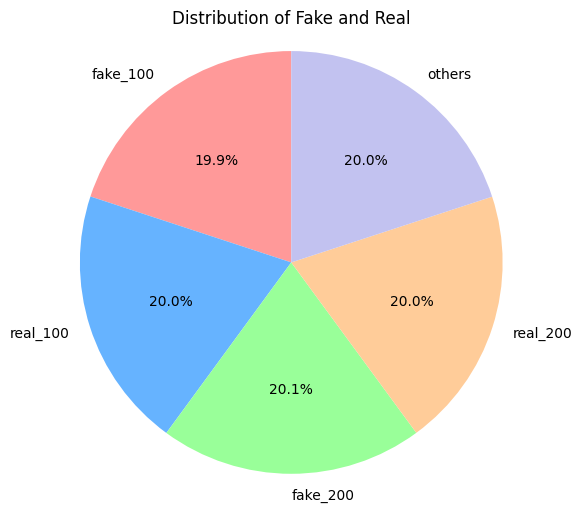

In [9]:
import matplotlib.pyplot as plt

labels = ['fake_100', 'real_100', 'fake_200', 'real_200', 'others']
sizes = [num_fake_100, num_real_100, num_fake_200, num_real_200, num_others]


colors = ['#ff9999', '#66b3ff', '#99ff99', '#ffcc99', '#c2c2f0']

plt.figure(figsize=(6, 6))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=colors)
plt.axis('equal')  
plt.title('Distribution of Fake and Real')
plt.show()


In [1]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
data_dir = r"F:\Gruaduation project\Dataset after preprocessing"

datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)
train_generator = datagen.flow_from_directory(
    data_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='sparse',  
    subset='training'
)
validation_generator = datagen.flow_from_directory(
    data_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='sparse',
    subset='validation'
)

Found 26469 images belonging to 5 classes.
Found 6615 images belonging to 5 classes.


In [2]:
import numpy as np
X_train, y_train = [], []
for i in range(len(train_generator)):
    X_batch, y_batch = train_generator[i]
    X_train.extend(X_batch)
    y_train.extend(y_batch)
X_train = np.array(X_train)
y_train = np.array(y_train)
X_val, y_val = [], []
for i in range(len(validation_generator)):
    X_batch, y_batch = validation_generator[i]
    X_val.extend(X_batch)
    y_val.extend(y_batch)
X_val = np.array(X_val)
y_val = np.array(y_val)

In [3]:

from glob import glob
import matplotlib.pyplot as plt
import os
from sklearn.model_selection import train_test_split
from itertools import chain
from datetime import datetime
import statistics
from tqdm import tqdm
import tensorflow as tf
# DenseNet Dependencies
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.activations import sigmoid
from tensorflow.keras.layers import Dense,Conv2D, Flatten, Dropout, MaxPooling2D, GlobalAveragePooling2D
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.metrics import Accuracy, Precision, Recall, AUC, BinaryAccuracy, FalsePositives, FalseNegatives, TruePositives, TrueNegatives
from tensorflow.keras.callbacks import CSVLogger, ModelCheckpoint
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.applications import DenseNet121, DenseNet169, DenseNet201, VGG16, ResNet50
from keras import backend as K
from tensorflow.keras import Sequential
import keras
import matplotlib
from sklearn.metrics import roc_curve, auc, roc_auc_score
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, LearningRateScheduler
from sklearn.metrics import roc_curve, auc
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers import Dropout

# DENSE

In [4]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

IMG_SHAPE = (224, 224, 3)
NUM_CLASSES = 5
OPTIMIZER = Adam(learning_rate=0.0001, beta_1=0.9, beta_2=0.999)

base_model = tf.keras.applications.DenseNet121(input_shape=IMG_SHAPE, include_top=False, weights='imagenet')

for layer in base_model.layers[:-50]: 
    layer.trainable = False

x = base_model.output    
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)  
x = Dense(256, activation='relu', kernel_regularizer=l2(0.01))(x) 
x = Dropout(0.4)(x)  

predictions = Dense(NUM_CLASSES, activation='softmax', name='Final')(x)
model = Model(inputs=base_model.input, outputs=predictions)
model.compile(
    loss='sparse_categorical_crossentropy',
    optimizer=OPTIMIZER,
    metrics=[
        'accuracy'
    ]
)

In [5]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

def get_callbacks(model_name):
    checkpoint = ModelCheckpoint(
        filepath=f'model.{model_name}.keras',  
        monitor='val_loss',
        mode='min',
        save_best_only=True,
        verbose=1
    )
    
    early_stop = EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True,
        verbose=1
    )
    
    reduce_lr = ReduceLROnPlateau(
        monitor='val_loss',
        factor=0.5,
        patience=5,
        verbose=1,
        min_lr=1e-6,
        min_delta=0.00001,
        mode='auto'
    )
    
    return [checkpoint, early_stop, reduce_lr]

callbacks = get_callbacks('DenseNetFinalVersion121')

history = model.fit(
    train_generator,
    epochs=4,
    validation_data=validation_generator,
    callbacks=callbacks
)

C:\Users\Sigma\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/4
828/828 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8229 - loss: 3.4506
Epoch 1: val_loss improved from inf to 1.30827, saving model to model.DenseNetFinalVersion121.keras
828/828 ━━━━━━━━━━━━━━━━━━━━ 2115s 2s/step - accuracy: 0.8230 - loss: 3.4494 - val_accuracy: 0.9998 - val_loss: 1.3083 - learning_rate: 1.0000e-04
Epoch 2/4
828/828 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9984 - loss: 1.0975
Epoch 2: val_loss improved from 1.30827 to 0.56065, saving model to model.DenseNetFinalVersion121.keras
828/828 ━━━━━━━━━━━━━━━━━━━━ 2013s 2s/step - accuracy: 0.9984 - loss: 1.0973 - val_accuracy: 1.0000 - val_loss: 0.5607 - learning_rate: 1.0000e-04
Epoch 3/4
828/828 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9998 - loss: 0.4490
Epoch 3: val_loss improved from 0.56065 to 0.18639, saving model to model.DenseNetFinalVersion121.keras
828/828 ━━━━━━━━━━━━━━━━━━━━ 2011s 2s/step - accuracy: 0.9998 - loss: 0.4488 - val_accuracy: 1.0000 - val_loss: 0.1864 - learning_rate: 1.0000e-04

In [10]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 9,979,857 (38.07 MB)

 Trainable params: 1,339,333 (5.11 MB)

 Non-trainable params: 5,961,856 (22.74 MB)

 Optimizer params: 2,678,668 (10.22 MB)

## evaluation the model

207/207 ━━━━━━━━━━━━━━━━━━━━ 410s 2s/step
Classification Report:

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1320
         1.0       1.00      1.00      1.00      1323
         2.0       1.00      1.00      1.00      1333
         3.0       1.00      1.00      1.00      1321
         4.0       1.00      1.00      1.00      1318

    accuracy                           1.00      6615
   macro avg       1.00      1.00      1.00      6615
weighted avg       1.00      1.00      1.00      6615



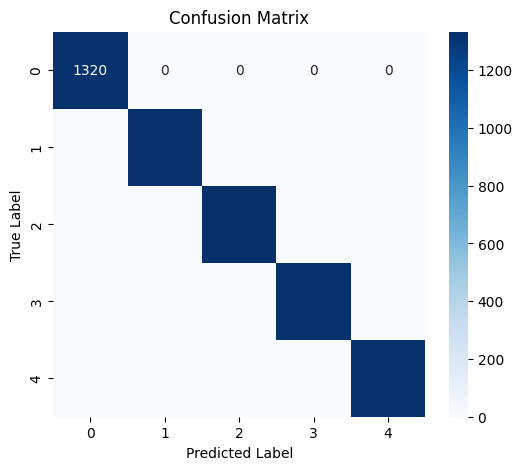

In [6]:
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

y_pred_probs = model.predict(X_val)
y_pred = np.argmax(y_pred_probs, axis=1)
print("Classification Report:\n")
print(classification_report(y_val, y_pred))

cm = confusion_matrix(y_val, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()

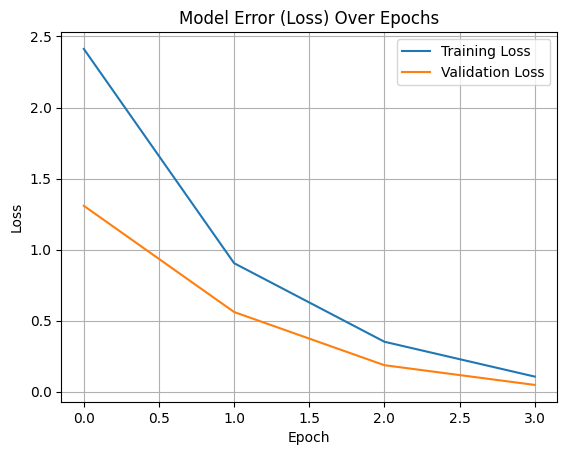

In [7]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Error (Loss) Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


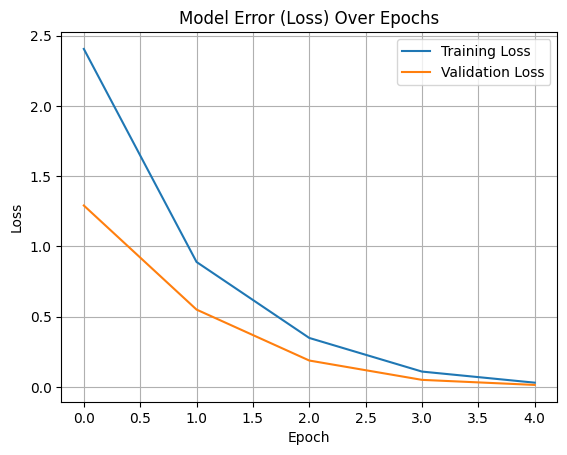

In [17]:
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Error (Loss) Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


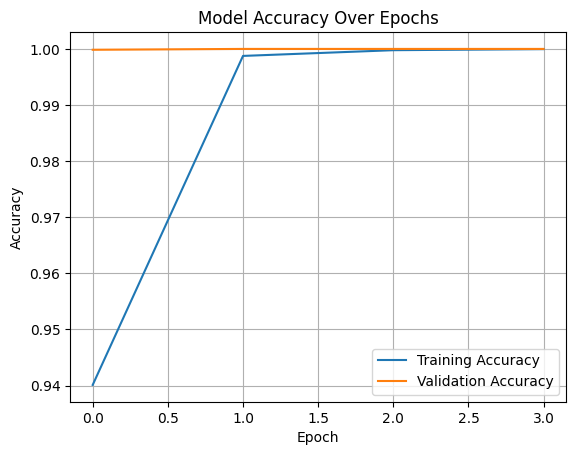

In [8]:
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()


In [9]:
print(train_generator.class_indices)  

{'100 DATA fake after processing': 0, '100 DATA real after processing': 1, '200 DATA fake after processing': 2, '200 DATA real after processing': 3, 'Others': 4}


1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
[[2.7696760e-05 5.1013703e-05 7.9318554e-05 9.9976248e-01 7.9486053e-05]]


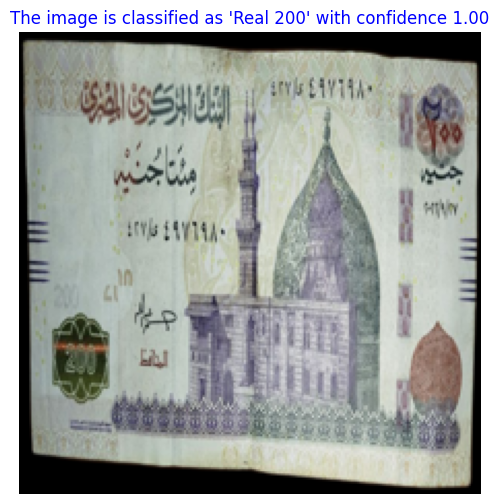

In [12]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\OneDrive\Pictures\Camera Roll\photo_2025-04-15_01-51-40.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
    0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
[[1.5066972e-05 6.8587119e-06 9.9997127e-01 1.8603142e-06 4.9633504e-06]]


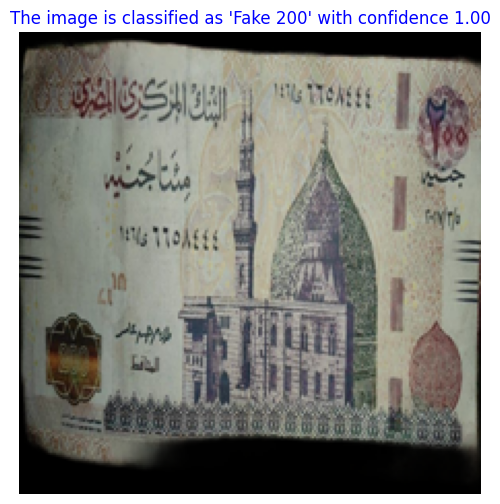

In [13]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\OneDrive\Pictures\Camera Roll\photo_2025-04-15_01-57-09.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
    0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
[[9.9975878e-01 1.3701200e-04 6.4924759e-05 1.6500131e-05 2.2785434e-05]]


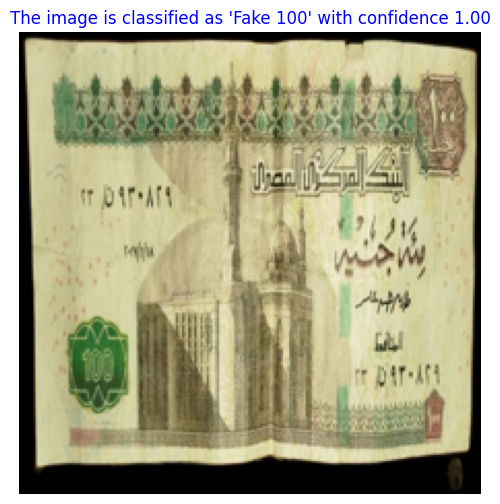

In [14]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\OneDrive\Pictures\Camera Roll\photo_1_2025-04-15_02-09-23.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
   0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step
[[1.0076903e-04 7.2157032e-05 9.9968362e-01 2.7769898e-05 1.1564747e-04]]


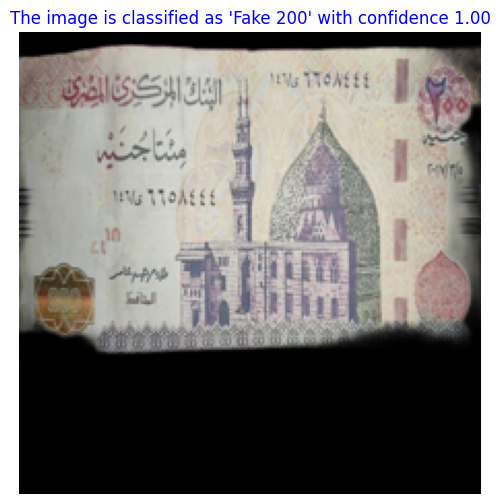

In [15]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\OneDrive\Pictures\Camera Roll\photo_2_2025-04-15_02-09-23.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
   0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
[[2.4425659e-05 2.1508687e-05 9.9992990e-01 9.0971516e-06 1.5078553e-05]]


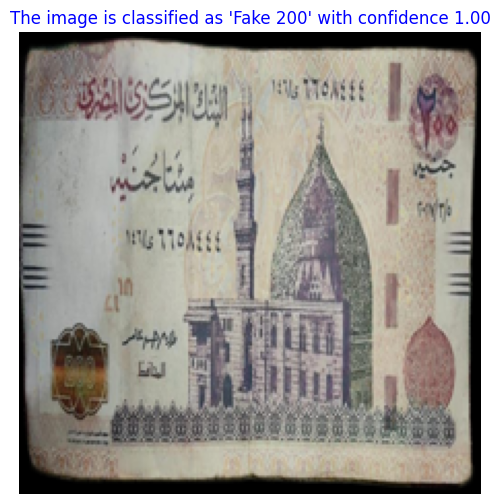

In [18]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\OneDrive\Pictures\Camera Roll\photo_4_2025-04-15_02-09-23.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
   0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step
[[1.0475312e-05 2.0737498e-05 9.9996126e-01 3.0552153e-06 4.4482763e-06]]


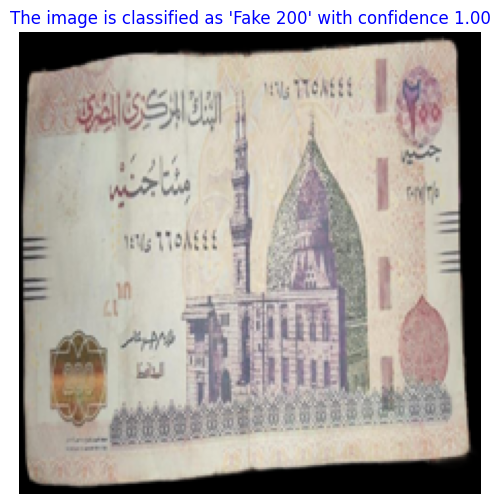

In [19]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\OneDrive\Pictures\Camera Roll\photo_5_2025-04-15_02-09-23.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
   0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step
[[1.3603734e-04 9.9975032e-01 3.6931015e-05 2.7585867e-05 4.9169201e-05]]


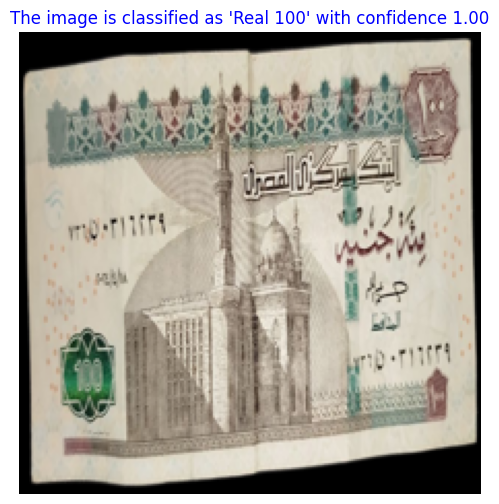

In [20]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\OneDrive\Pictures\Camera Roll\photo_2024-11-22_23-36-05.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
   0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
[[1.2274983e-04 2.0078999e-04 7.8717899e-04 9.9867463e-01 2.1466194e-04]]


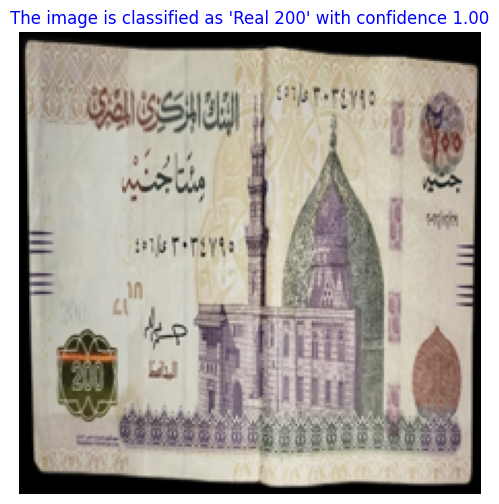

In [21]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\OneDrive\Pictures\Camera Roll\photo_2_2025-04-15_02-21-19.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
   0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step
[[7.35611029e-05 1.13216636e-04 3.51686234e-04 9.99348819e-01
  1.12793212e-04]]


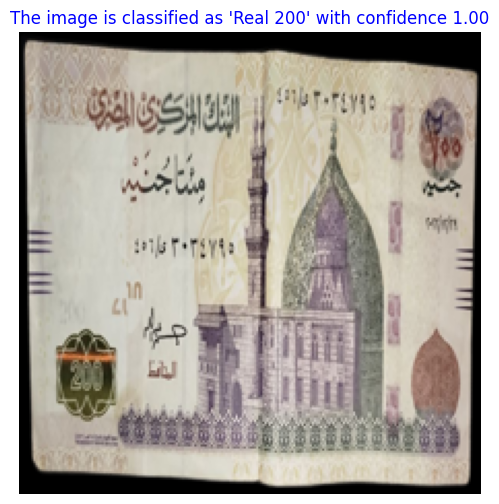

In [22]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\OneDrive\Pictures\Camera Roll\photo_1_2025-04-15_02-21-19.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
   0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
[[4.0172826e-04 1.0980158e-03 4.3864376e-03 9.9317980e-01 9.3404989e-04]]


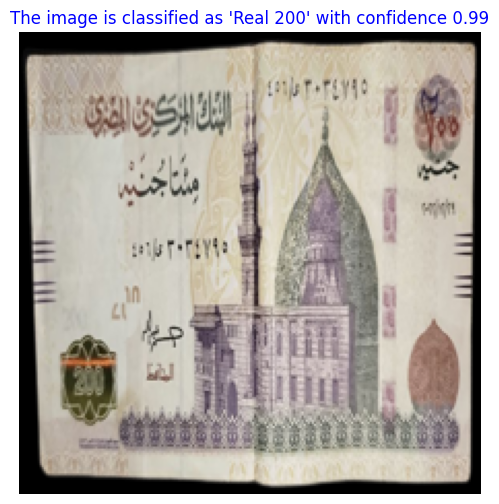

In [23]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\OneDrive\Pictures\Camera Roll\test\photo_1_2025-04-15_02-29-56.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
   0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step
[[9.9815947e-01 1.2625231e-03 4.3368340e-04 7.4392759e-05 6.9813985e-05]]


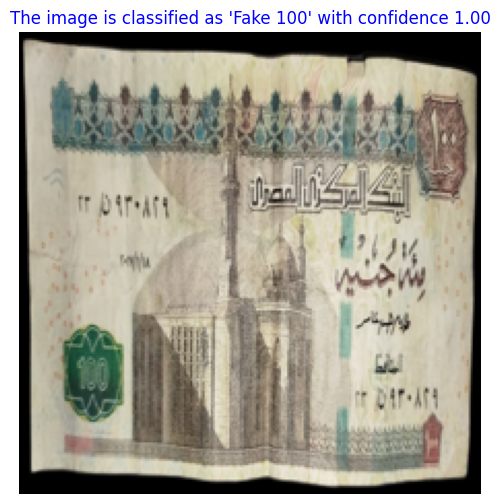

In [24]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\OneDrive\Pictures\Camera Roll\test\photo_2_2025-04-15_02-29-56.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
   0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step
[[1.3310622e-04 4.1660745e-04 1.0065219e-03 9.9804604e-01 3.9767029e-04]]


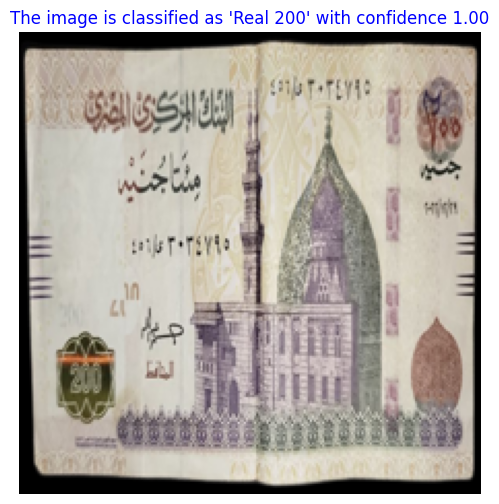

In [25]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\OneDrive\Pictures\Camera Roll\test\photo_3_2025-04-15_02-29-56.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
   0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
[[7.35611029e-05 1.13216636e-04 3.51686234e-04 9.99348819e-01
  1.12793212e-04]]


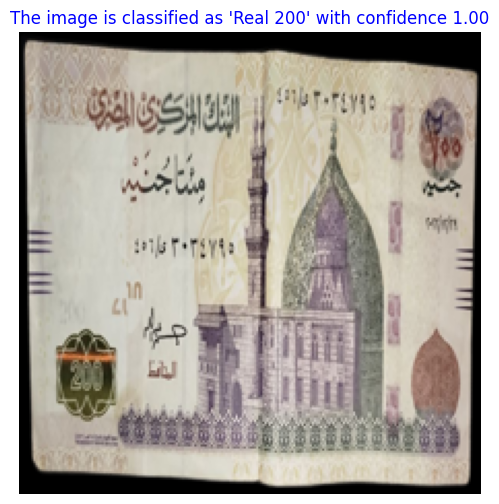

In [26]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\OneDrive\Pictures\Camera Roll\photo_1_2025-04-15_02-21-19.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
   0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step
[[9.98429716e-01 1.10836094e-03 2.74725433e-04 1.13563234e-04
  7.36676157e-05]]


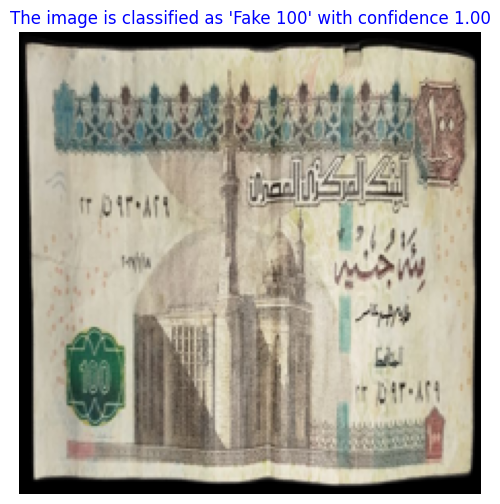

In [27]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\OneDrive\Pictures\Camera Roll\test\photo_5_2025-04-15_02-29-56.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
   0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step
[[7.5160456e-04 9.9835771e-01 3.0503367e-04 1.3617822e-04 4.4944091e-04]]


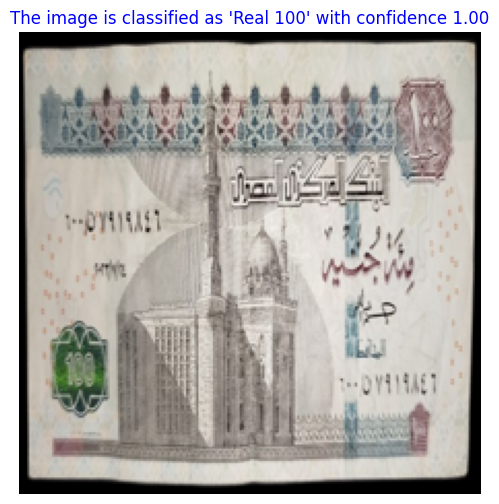

In [28]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\OneDrive\Pictures\Camera Roll\test\photo_8_2025-04-15_02-29-56.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
   0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 13s 13s/step
[[4.3140381e-04 9.9860054e-01 3.9393074e-04 1.1854874e-04 4.5560044e-04]]


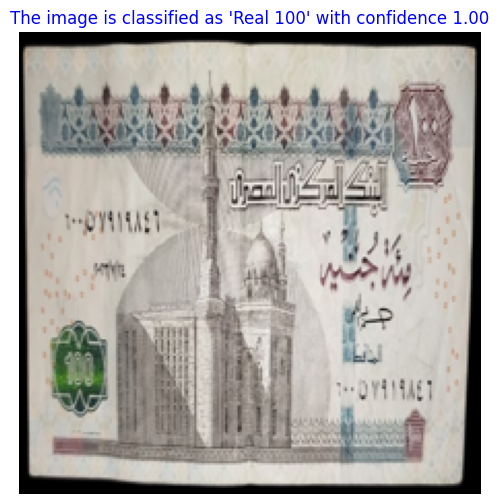

In [29]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\OneDrive\Pictures\Camera Roll\test\photo_7_2025-04-15_02-29-56.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
   0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step
[[2.2851375e-04 7.3840603e-04 2.0677906e-03 9.9637008e-01 5.9519208e-04]]


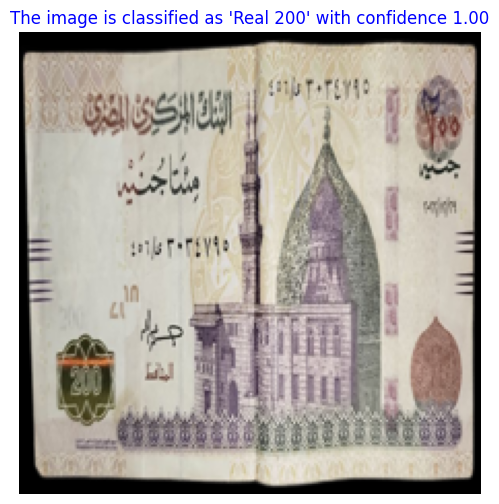

In [30]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\OneDrive\Pictures\Camera Roll\test\photo_4_2025-04-15_02-29-56.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
   0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
[[2.2540959e-05 7.8812300e-06 7.5228108e-06 1.6713203e-06 9.9996042e-01]]


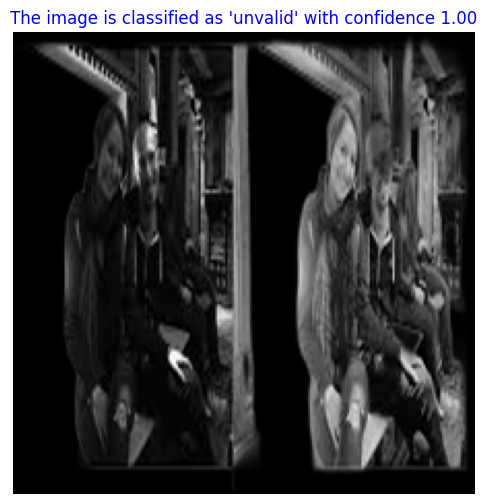

In [31]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\OneDrive\Pictures\Feedback\IMG-20241228-WA0013.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
    0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
[[0.00527443 0.00761219 0.00685201 0.00634373 0.97391766]]


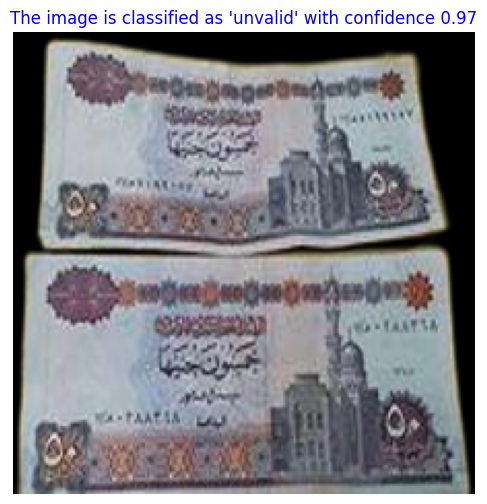

In [32]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"F:\Gruaduation project\Money2\datasets\50\50.88.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
    0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step
[[1.16897216e-04 2.58878572e-04 2.68192758e-04 1.26429906e-04
  9.99229670e-01]]


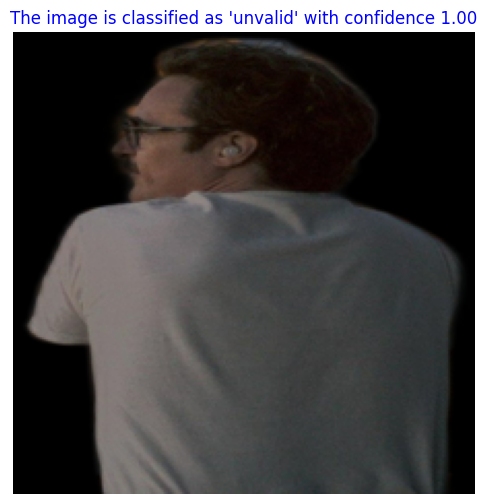

In [34]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\OneDrive\Pictures\Picture\wallpaperflare.com_wallpaper (2).jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
    0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step
[[3.3211519e-03 9.9644214e-01 1.3007921e-04 4.9120623e-05 5.7475601e-05]]


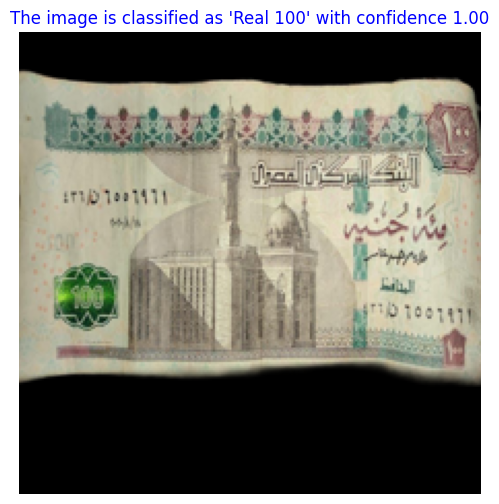

In [6]:

from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\Downloads\photo_2025-04-20_20-31-58.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
    0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
[[6.3779903e-06 9.9996233e-01 7.6692904e-06 6.3821153e-06 1.7215862e-05]]


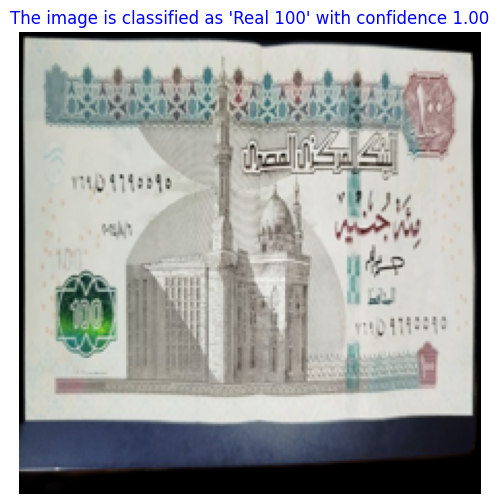

In [8]:

from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\Downloads\photo_2025-04-20_20-36-55.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
    0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
[[1.7904241e-06 9.9998653e-01 3.7942661e-06 1.2155294e-06 6.6596776e-06]]


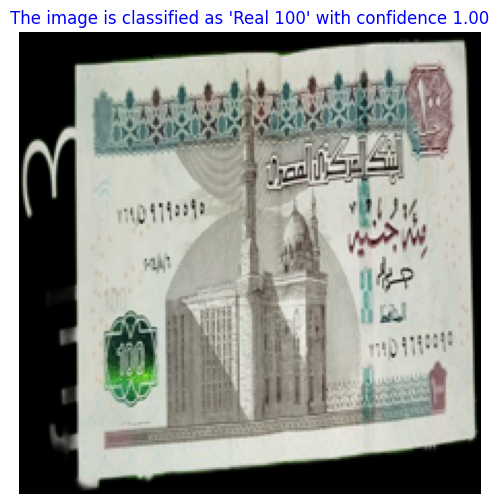

In [9]:


from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\Downloads\photo_2025-04-20_20-38-50.jpg"

with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
    0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 16s 16s/step
[[9.9383885e-01 3.4343707e-03 2.5261776e-03 1.0386416e-04 9.6752046e-05]]


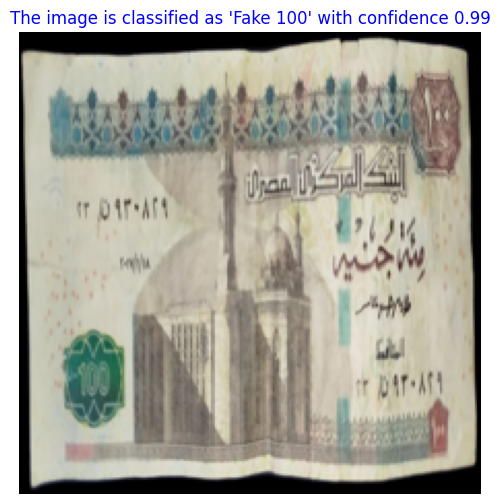

In [10]:


from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\Downloads\photo_2025-04-20_21-18-17.jpg"

with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
    0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 16s 16s/step
[[1.8370652e-05 1.4348344e-05 9.9995649e-01 1.8972418e-06 8.9223522e-06]]


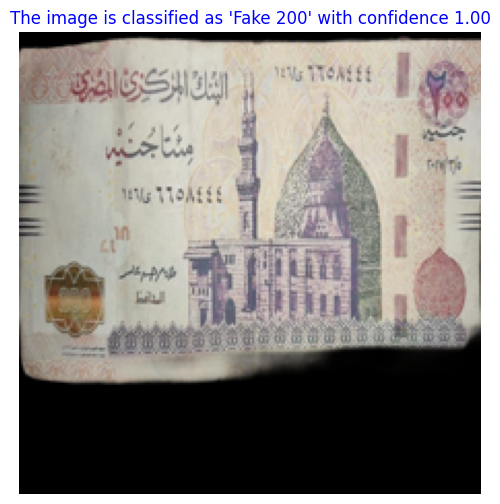

In [14]:



from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\Downloads\photo_2025-04-20_21-30-41.jpg"

with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
    0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 16s 16s/step
[[1.5911224e-05 1.2767821e-05 9.9995697e-01 3.5637406e-06 1.0837088e-05]]


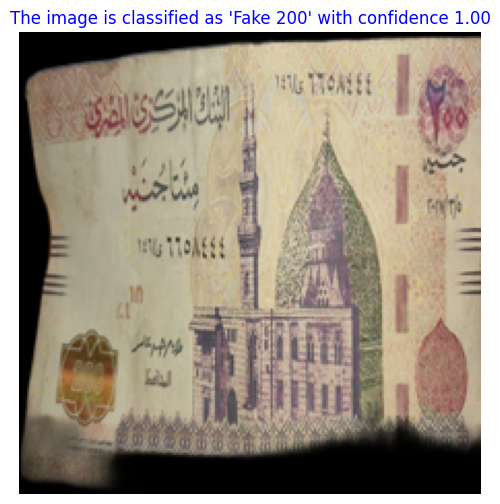

In [15]:



from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\Downloads\photo_2025-04-20_21-30-45.jpg"

with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
    0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step
[[1.2794647e-05 1.2045886e-05 9.9996722e-01 2.3250839e-06 5.5588416e-06]]


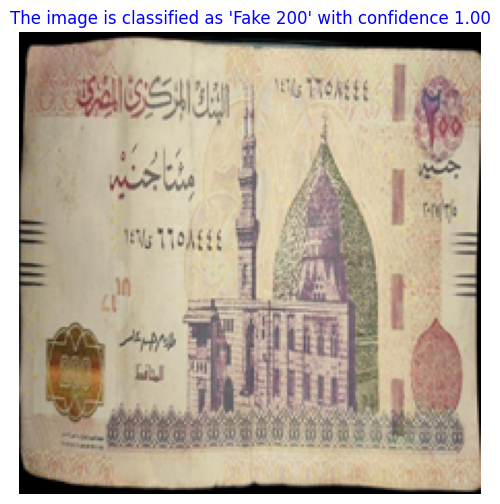

In [16]:



from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\Downloads\photo_2025-04-20_21-30-50.jpg"

with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
    0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step
[[2.2851375e-04 7.3840603e-04 2.0677906e-03 9.9637008e-01 5.9519208e-04]]


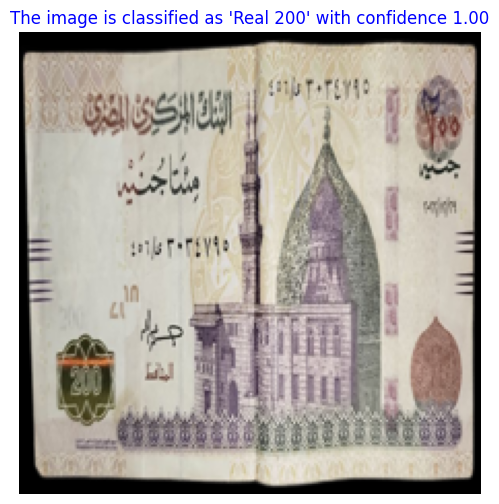

In [17]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\OneDrive\Pictures\Camera Roll\test\photo_4_2025-04-15_02-29-56.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
   0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 16s 16s/step
[[2.2851375e-04 7.3840603e-04 2.0677906e-03 9.9637008e-01 5.9519208e-04]]


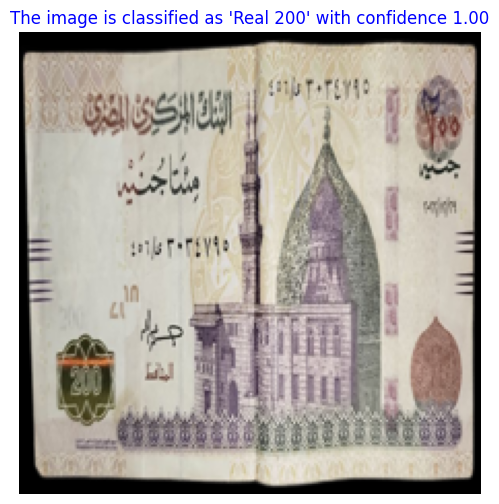

In [18]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\OneDrive\Pictures\Camera Roll\test\photo_4_2025-04-15_02-29-56.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
   0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step
[[1.5559548e-05 8.3954828e-06 9.9993217e-01 6.3820670e-07 4.3262695e-05]]


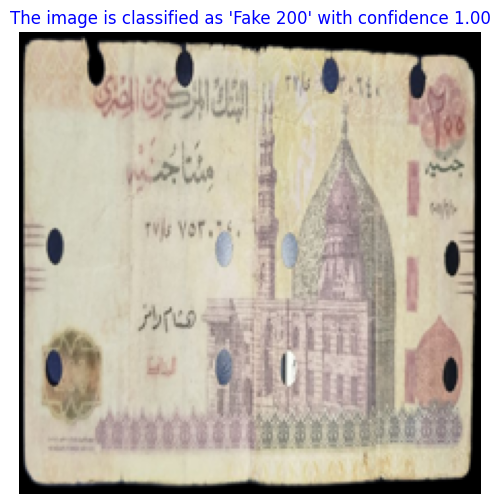

In [19]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\Downloads\photo_2025-04-20_21-18-21.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
   0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step
[[4.0573010e-05 2.7057391e-05 9.9983704e-01 3.7678540e-06 9.1429902e-05]]


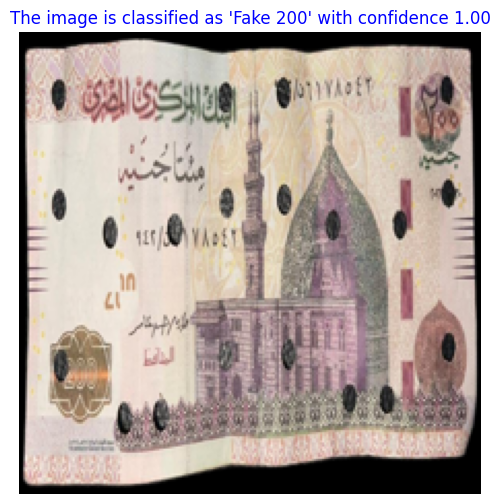

In [20]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\Downloads\photo_2025-04-20_21-41-53.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
   0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 16s 16s/step
[[2.2897872e-05 2.6195139e-05 1.0663345e-05 1.3083618e-05 9.9992716e-01]]


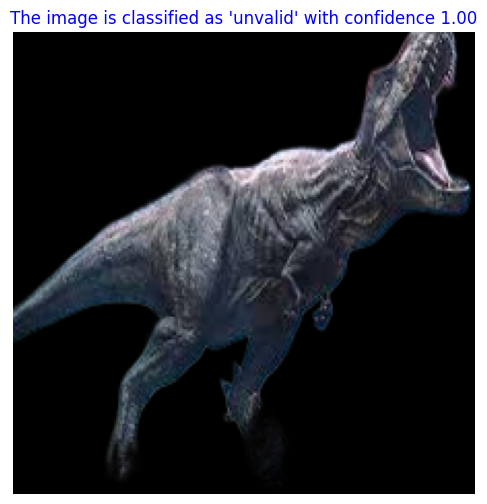

In [21]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\Downloads\Telegram Desktop\photo_4_2025-04-20_21-45-19.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
   0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 16s 16s/step
[[2.7077440e-06 8.0892649e-05 3.6032910e-05 2.0084228e-06 9.9987829e-01]]


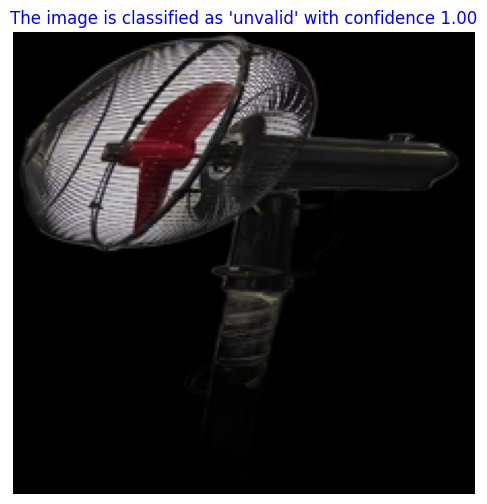

In [22]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\Downloads\Telegram Desktop\photo_3_2025-04-20_21-45-19.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
   0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 16s 16s/step
[[1.2130067e-03 5.8847978e-03 3.3744115e-02 1.7489523e-04 9.5898312e-01]]


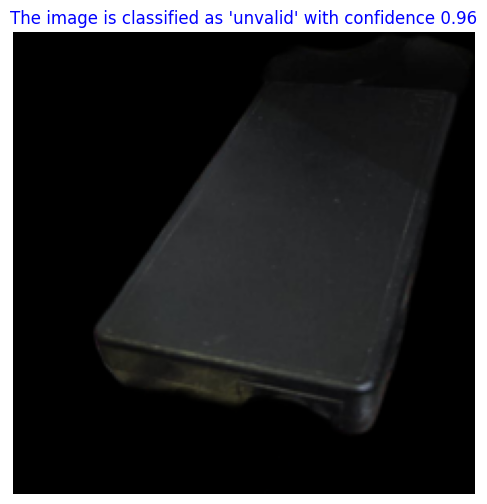

In [23]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\Downloads\Telegram Desktop\photo_2_2025-04-20_21-45-19.jpg"
with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
   0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
[[5.7014295e-05 7.7539065e-05 6.5192762e-05 5.1419483e-05 9.9974889e-01]]


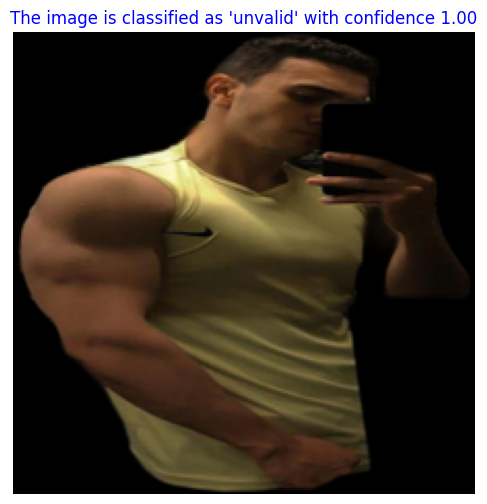

In [24]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\Downloads\Telegram Desktop\photo_1_2025-04-20_21-45-19.jpg"

with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
   0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step
[[0.01607147 0.30456698 0.23159611 0.0319262  0.41583925]]


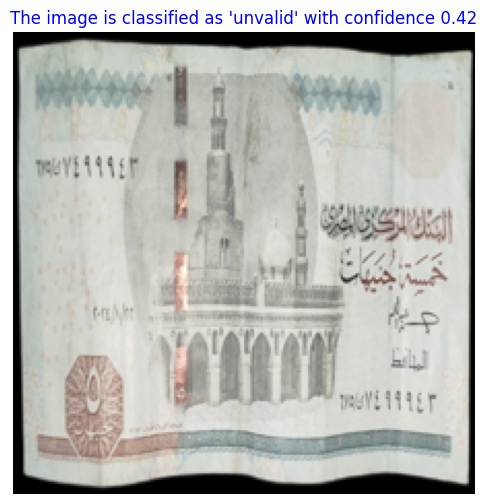

In [26]:
from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\Downloads\photo_2025-04-20_21-53-18.jpg"


with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
   0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 16s 16s/step
[[2.3108821e-03 9.9732107e-01 2.4203291e-04 1.6916345e-05 1.0918396e-04]]


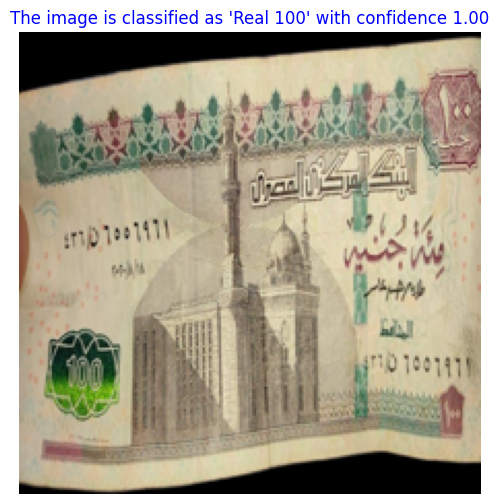

In [27]:

from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\Downloads\photo_2025-04-20_21-59-08.jpg"



with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
   0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
[[1.2920280e-04 1.2414936e-03 4.0118657e-03 7.6538519e-05 9.9454087e-01]]


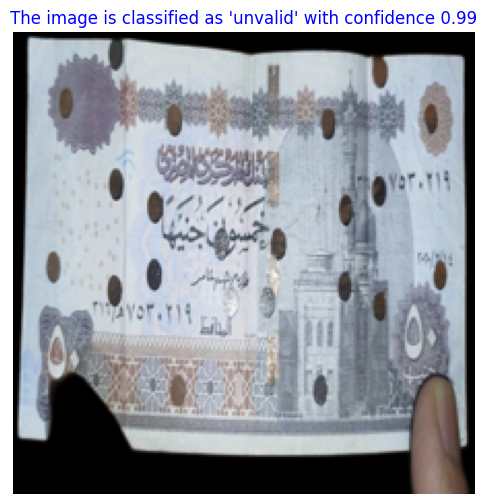

In [28]:


from tensorflow.keras.preprocessing.image import img_to_array
from rembg import remove
from PIL import Image
import numpy as np
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import io


model_path = r"C:\Users\Sigma\Downloads\model.DenseNetFinalVersion121.keras"
model = load_model(model_path)

image_path = r"C:\Users\Sigma\Downloads\photo_2025-04-20_22-01-02.jpg"




with open(image_path, "rb") as file:
    input_image = file.read()

output_image_data = remove(input_image)
output_image = Image.open(io.BytesIO(output_image_data)).convert("RGB")


bbox = output_image.getbbox() 
cropped_image = output_image.crop(bbox)
cropped_image = cropped_image.resize((224, 224))


img_array = img_to_array(cropped_image)
img_array = np.expand_dims(img_array, axis=0)
img_array = img_array / 255.0

prediction = model.predict(img_array)

predicted_class = np.argmax(prediction[0])
confidence = prediction[0][predicted_class]

class_names = {
   0: "Fake 100",
    1: "Real 100",
    2: "Fake 200",
    3: "Real 200",
    4: "unvalid"
}
label = f"The image is classified as '{class_names[predicted_class]}' with confidence {confidence:.2f}"


print(prediction)
plt.figure(figsize=(6, 6))
plt.imshow(cropped_image)
plt.title(label, fontsize=12, color="blue")
plt.axis('off')
plt.show()